<a href="https://colab.research.google.com/github/abdulwahabhassan/data-science-project/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

# End-to-end Multi-class Dog Bread Classification

This notebook builds an end-to-end multi-class image classifier using the
[TensorFlow](https://www.tensorflow.org) Deep Learning platform.


## 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what bread of dog it is.


## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification


## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog bread of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


## 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready


* Import TensorFlow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?

labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

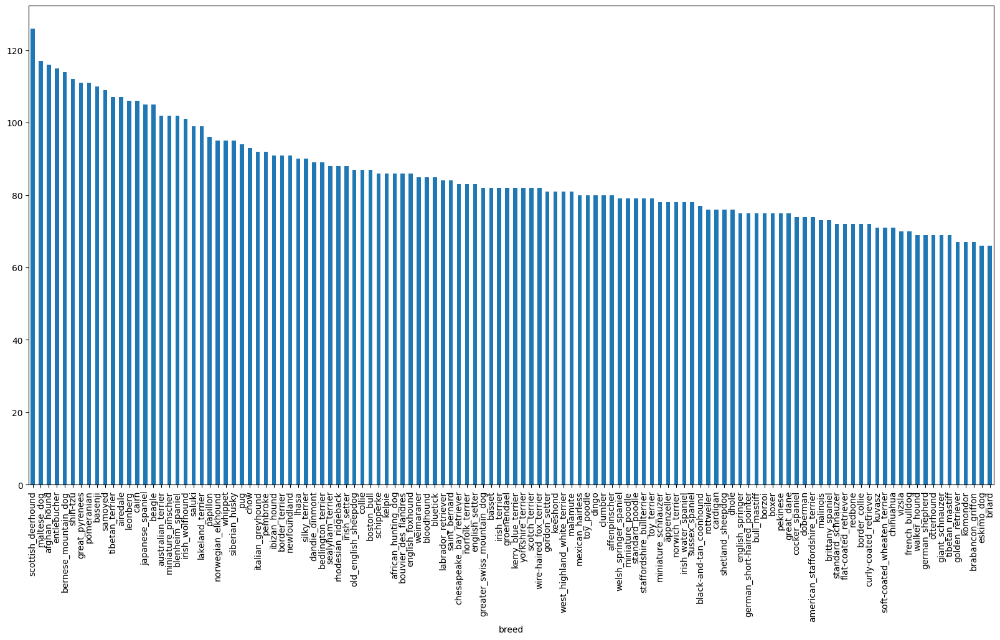

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().mean()

np.float64(85.18333333333334)

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

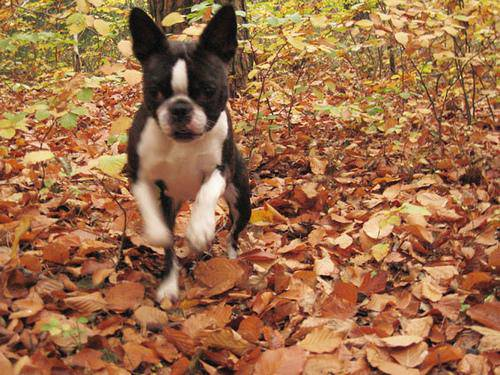

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:

# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os

# Check whether number of filenames matches number of actual image files
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! ")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! 


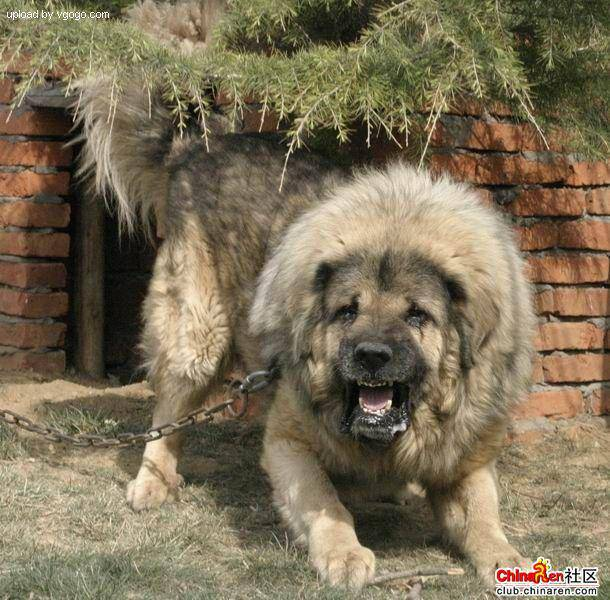

In [ ]:
# Check an image
Image(filenames[9000])

In [ ]:
# Check the breed
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
# Prepare labels
import numpy as np

# labels = np.array(labels)
# or
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Matches")
else:
  print("Does not match")

Matches


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
# len(boolean_labels)
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # cast booleans to 0 or 1; there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
# Start with about a thousand for experimenting to get things working before using the full dataset
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:100}

In [ ]:
# Let's split data into train and validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
    ) # random_state same as setting np.random.seed()

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

### Preprocessing images - turning images into tensors (numerical representations a.k.a matrices)


Write a reusable function to do the following:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Convert `image` from jpg to Tensors (numerical representations)
4. Normalize `image` (convert colour channel values from 0-255 to 0-1)
5. Resize `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # Read an image from a file into an array.
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
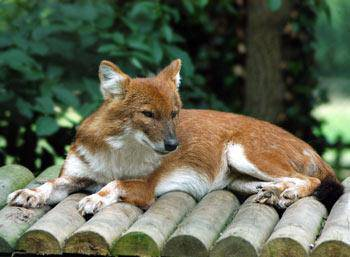

In [ ]:
image

In [ ]:
image.max(), image.min() # RGB values ranging between 0 and 255

(np.uint8(255), np.uint8(0))

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into tensor
image_tensor = tf.constant(image)
# or tf.convert_to_tensor(image)

In [ ]:
image.shape, image_tensor.shape

((257, 350, 3), TensorShape([257, 350, 3]))

In [ ]:
# 257 matrices of 350 rows of 3 columns or 257 matrices of 350 x 3
# 2 matrics of 350 rows of 3 columns or 2 matrices of 350 x 3

In [ ]:
# Define image size
IMG_SIZE = 224

# Important to feed images to ml models in same format as they were trained on

# Function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32) # a.k.a normalization
  # Resize image to desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])
  # if label is None:
  #   return image
  # else:
  #   return image, label
  return image

### Turn data into batches

* 32 is generally the default batch size with most deep learning moodels

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo
(process_image(X[42]), tf.constant(y[42])) # turn boolean labels (y) into Tensors as well

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Funtion to turn data X and y into batches
BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's a training data but doesn't shuffle if its a validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a validation dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays of plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

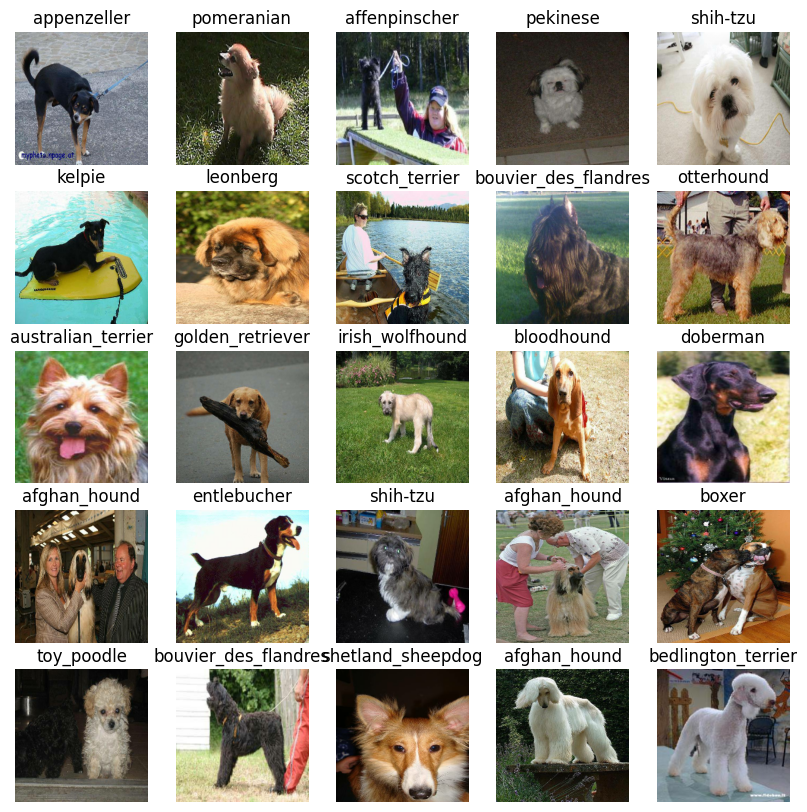

In [ ]:
# Visualize training set
show_25_images(train_images, train_labels)

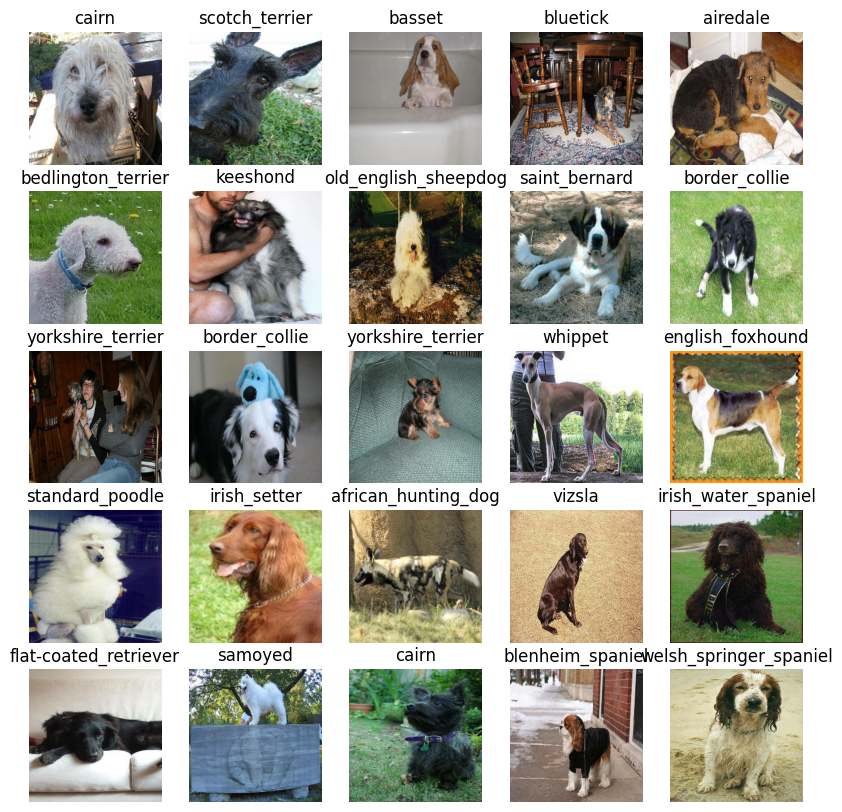

In [ ]:
# Visualize validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we buils a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use (Transfer Learning) from TensorFlow Hub - https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
import tf_keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
        loss=tf_keras.losses.CategoricalCrossentropy(),
        optimizer=tf_keras.optimizers.Adam(),
        metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


* 1001 = the number of classes MobileNetV2 was trained on.

* The Non-trainable params/weights (5,432,713) are the pretrained weights of MobileNetV2 model that it has learned from its previous training.

* dense_3 (Dense) is the layer added ontop.

* (None, 120) For each input image, the model will output a vector of 120 numbers (corresponding to the 120 labels of the training labels)

* 120,240 Calculated as: 1001 (inputs) × 120 (outputs) + 120 (biases) = 120,240.

* The Trainable params/weights(120,240) calculated as: 1001 (inputs) × 120 (outputs) + 120 (biases) = 120,240. This are the weights that can be adjusted which the model will use to learn patters tailored specifically to the 120 classes (classification labels)

* This implies we're using MobileNetV2 as a feature extractor. Instead of training the whoe network from scratch, we froze its weights and only trained the final dense layer to classify into 120 categories. This is a transfer learning setup.

When deciding which activation and loss function to use, here's a guide:

* Binary classification:
  - Activation: Sigmoid
  - Loss: Binary Crossentropy

* Multi-class classification:
  - Activation: softmax
  - Loss: Categorical Crossentropy

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():

  # Create a log directory for storing TensorBoard logs with each log dir name in the dir corresponding to the time of training
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.


In [ ]:
# Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training a model (on subset of data)
To minimize time between experiments, we are going to train the first model on only a thousand images to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

This is number of training passes or number of times we want the model to have a chance to look at the training data and learn patterns from it

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available Yes!" if tf.config.list_physical_devices("GPU") else "not available")

GPU available Yes!


Create a function that trains a model:

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 163s 6s/step - loss: 4.5955 - accuracy: 0.0988 - val_loss: 3.4362 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 3s 137ms/step - loss: 1.6327 - accuracy: 0.7000 - val_loss: 2.1567 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 5s 205ms/step - loss: 0.5620 - accuracy: 0.9488 - val_loss: 1.6523 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 213ms/step - loss: 0.2477 - accuracy: 0.9850 - val_loss: 1.4664 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 135ms/step - loss: 0.1452 - accuracy: 1.0000 - val_loss: 1.3780 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 136ms/step - loss: 0.0983 - accuracy: 1.0000 - val_loss: 1.3373 - val_accuracy: 0.6450
Epoch 7/100
25/25 [================

* accuracy of 1.0 indicating overfitting on the training data

* val_accuracy of 0.64 indicating model's poor ability to generalize/perform well on data (validation data) it hasn't seen before/trained on

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train the model)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 109ms/step


array([[1.0759699e-03, 1.4172723e-04, 2.4255009e-03, ..., 3.6980119e-04,
        1.8559162e-05, 1.0485312e-03],
       [1.9462889e-03, 5.3200306e-04, 6.0167052e-03, ..., 2.7341954e-04,
        1.8636563e-03, 5.5127883e-05],
       [1.5025503e-05, 4.1301300e-06, 2.3217121e-06, ..., 7.3407796e-06,
        6.9790694e-06, 9.0066387e-05],
       ...,
       [9.5156092e-06, 2.3170689e-05, 1.9451572e-05, ..., 1.1795186e-05,
        3.2764219e-05, 1.6088225e-05],
       [2.2298659e-04, 4.8551832e-05, 2.1375859e-05, ..., 2.7361790e-05,
        1.9226030e-05, 4.1427459e-03],
       [2.1521958e-04, 2.3749353e-05, 1.5634684e-03, ..., 8.3712453e-04,
        4.9887074e-04, 4.7466037e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.07596989e-03, 1.41727229e-04, 2.42550089e-03, 1.26097613e-04,
       1.31931316e-04, 7.42883731e-06, 4.57100794e-02, 3.21252504e-04,
       2.42407419e-04, 2.75895349e-04, 9.47061126e-05, 2.15207710e-05,
       4.77175810e-04, 9.42398256e-05, 7.22844052e-05, 1.95200846e-04,
       9.08701986e-05, 1.11973956e-01, 8.32547539e-06, 3.34574404e-04,
       5.60279412e-04, 2.46929296e-04, 1.98443449e-05, 1.04738737e-03,
       3.59549231e-05, 7.99543690e-04, 2.30934635e-01, 9.24976994e-05,
       5.21070440e-04, 5.65323280e-04, 4.67042206e-04, 1.49487518e-03,
       3.52580682e-03, 9.65254512e-05, 1.57303817e-04, 2.52493564e-02,
       8.50410379e-06, 1.76681395e-04, 1.93446976e-04, 1.07967171e-05,
       4.91160434e-04, 4.07041298e-05, 7.78386675e-05, 5.79006992e-05,
       3.67597931e-05, 8.83606190e-05, 3.34704928e-05, 1.41212266e-04,
       1.39912518e-04, 6.48302448e-05, 2.54831702e-05, 1.82023814e-05,
       3.97847354e-04, 3.57344397e-05, 1.55095986e-05, 1.75883270e-05,
      

These are associated probabilities with the labels (dog breeds). The one with the highest probability is what the model predicts to be the highest likelyhood of the of the dog in the image corresponding to the label/class (breed)

In [ ]:
# First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.03658012e-04 2.14617845e-04 9.71040718e-05 1.32623434e-04
 2.65522231e-03 1.56621303e-04 3.03427398e-04 6.56795979e-04
 2.62879822e-02 4.35459539e-02 7.92495775e-05 3.23982749e-05
 1.53983565e-04 4.80313739e-03 1.08039484e-03 3.63862747e-03
 2.22512572e-05 1.51565167e-04 1.27070787e-04 6.18950813e-04
 4.27746963e-05 1.28029508e-03 4.83720942e-05 3.52374227e-05
 4.07456681e-02 1.27797190e-04 3.81595346e-05 9.16798454e-05
 3.10613366e-04 1.32565634e-04 4.80579038e-05 3.94304283e-04
 1.43801371e-04 8.09125049e-05 5.48746430e-05 9.37957229e-05
 1.09849745e-04 2.40624082e-04 6.06929170e-05 1.98933542e-01
 2.76481616e-04 3.47138885e-05 6.53335406e-03 8.59629654e-06
 5.78802952e-04 3.15955403e-05 5.30782156e-04 2.30504971e-04
 7.81321796e-05 8.54124009e-05 7.96076420e-05 3.99244345e-05
 3.65327985e-04 5.46733197e-03 6.97337091e-05 5.03285555e-04
 2.30618316e-04 3.83329752e-05 8.94656914e-05 1.57812203e-04
 1.41094197e-05 7.05195882e-04 6.24835911e-06 2.69373035e-04
 9.50780959e-05 9.203779

In [ ]:
unique_breeds[113]

'walker_hound'

**Note**: Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a prediction label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatch the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
  * Prediction label
  * Validation labels (truth labels)
  * Validation images

Let's make some function to make them all a bit more visual.

We'll create a function which:
  * Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
  * Convert the prediction probabilities to a predicted label.
  * Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on whether the predictions is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)


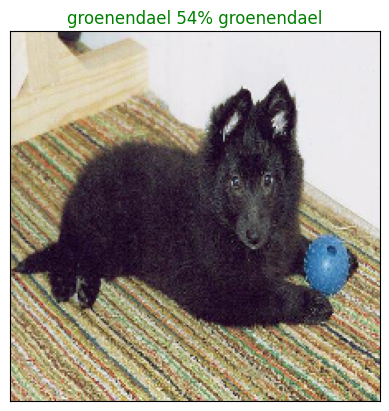

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

In [ ]:
# A function view model's top 10 predictions
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

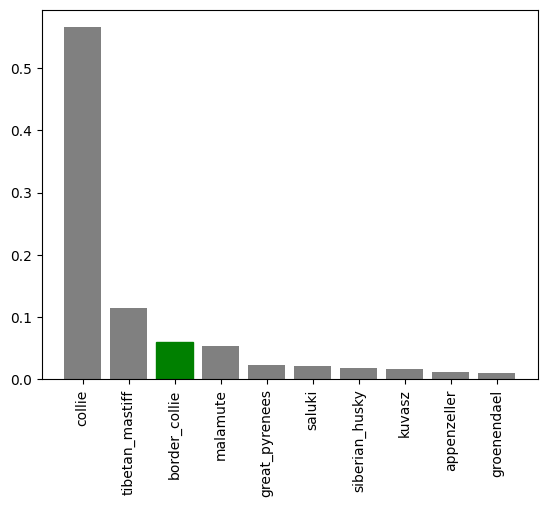

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

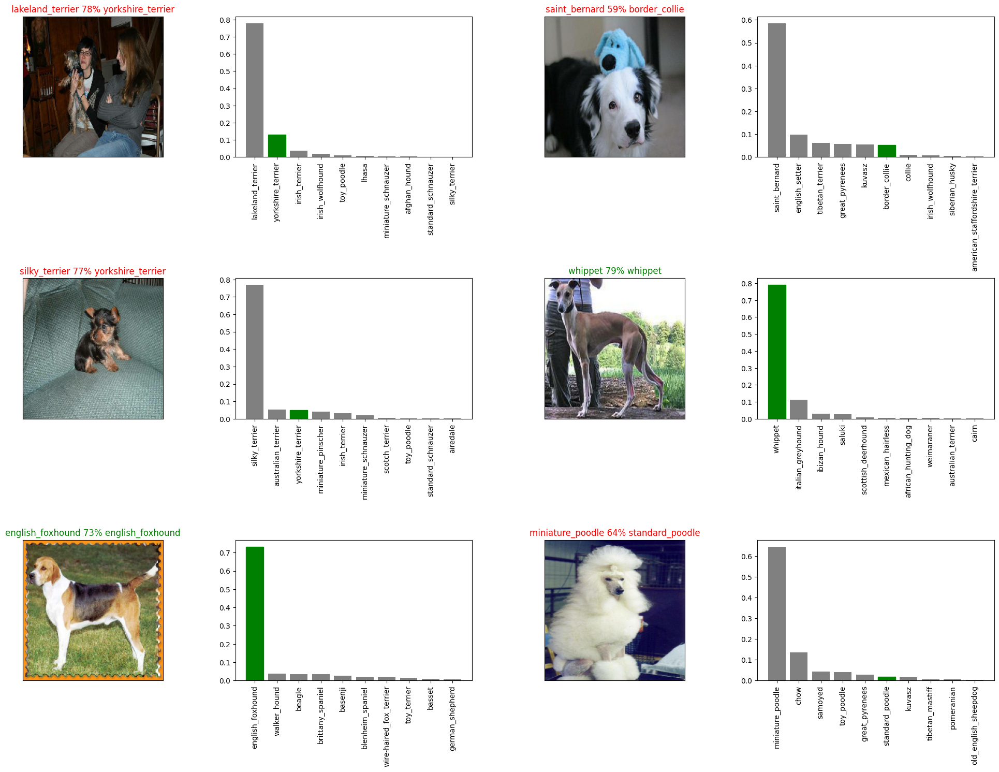

In [ ]:
# Check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250927-11181758971898-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250927-11181758971898-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20250922-22311758580266-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20250922-22311758580266-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 1.1990 - accuracy: 0.6750


[1.1990159749984741, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2039 - accuracy: 0.6700


[1.2038631439208984, 0.6700000166893005]

## Training a bigger model (on the full dataset instead of only 1000)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

Running the cell below will take a while to complete during the first epoch since the model is training on the full dataset and because the GPU/CPU has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
# full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])


In [ ]:
# Save model trained on full image dataset
# save_model(full_model, suffix="full-model-images-mobilenetv2-Adam")

In [ ]:
# load the saved full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20250923-01341758591272-full-model-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20250923-01341758591272-full-model-images-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1a777d181483b0982732fa4128df7f8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e09f4ff3f7acee994812650a2fc7edef.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd1101676d8c7fa8522dd5ebd1129d17.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e302e1c88252f91357e62b8fd340f2d1.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e19900119c7d3ce48d4035cd0211be72.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e138d8e5745db1213cc08131e7420c7a.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** Calling `predict()` on the full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 224s 667ms/step


In [ ]:
test_predictions

array([[1.8773740e-08, 3.3656172e-10, 4.1528940e-09, ..., 1.3901860e-05,
        1.4441691e-03, 3.1008403e-07],
       [9.6566199e-10, 8.6516440e-11, 5.8229541e-09, ..., 1.3382114e-08,
        1.5783279e-07, 1.9780709e-06],
       [2.7360561e-10, 5.0567878e-10, 2.9294617e-08, ..., 1.0026744e-09,
        3.3727143e-09, 6.1385417e-09],
       ...,
       [1.3064026e-04, 8.1679827e-06, 5.5501976e-09, ..., 5.8441702e-07,
        6.6062682e-08, 5.7614631e-08],
       [3.4941650e-11, 2.4478426e-09, 3.1299262e-12, ..., 2.2677494e-08,
        5.1007457e-05, 1.2233227e-10],
       [4.1547921e-08, 7.4036501e-04, 8.5232472e-07, ..., 1.0267537e-04,
        5.8060477e-06, 7.7426988e-12]], dtype=float32)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.87737399e-08, 3.36561723e-10, 4.15289403e-09, ...,
        1.39018603e-05, 1.44416909e-03, 3.10084033e-07],
       [9.65661995e-10, 8.65164398e-11, 5.82295412e-09, ...,
        1.33821141e-08, 1.57832787e-07, 1.97807094e-06],
       [2.73605610e-10, 5.05678777e-10, 2.92946165e-08, ...,
        1.00267439e-09, 3.37271433e-09, 6.13854167e-09],
       ...,
       [2.83271697e-13, 9.96209337e-10, 1.13067287e-07, ...,
        1.74305737e-09, 1.45503325e-08, 1.29695506e-12],
       [4.65001301e-12, 3.54520970e-12, 6.74639598e-13, ...,
        1.76191794e-09, 2.79503590e-11, 2.04140307e-12],
       [2.43137427e-10, 7.94149690e-10, 1.98825140e-11, ...,
        2.45962611e-10, 1.06134932e-08, 3.91334339e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

Format predictions into Kaggle's submission sample format.

To do this:
- Create a pandas DataFrame with an ID column and a column for each dog breed
- Add data to the ID column by extracting the test image ID's from their filepaths
- Add data (the prediction probabilities) to each of the dog breed columns
- Export the DataFrame as a CSV to submit to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Export to CSV
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

Making predictions on custom images

To make predictions on custom images, we'll:
- Turn the filepaths into data batches using `create_data_batches()` and since our custom images won't have labels, we'll set the `test_data` parameter to `True`
- Pass the custom image data batch to our model's `predict()` method
- Convert the predictions output probabilities to prediction labels
- Compare the predicted labels to the custom images

In [109]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [110]:
custom_image_paths

['drive/MyDrive/Dog Vision/dogs/download2.jpeg',
 'drive/MyDrive/Dog Vision/dogs/download1.jpeg',
 'drive/MyDrive/Dog Vision/dogs/download3.jpeg']

In [111]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [112]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 745ms/step


array([[7.60767560e-11, 1.06510648e-10, 3.99708000e-09, 1.43868464e-08,
        1.46577486e-10, 3.01393563e-11, 9.60299644e-08, 4.48149545e-10,
        6.34347075e-10, 2.86005153e-09, 4.26538770e-11, 9.37407235e-11,
        6.25321235e-08, 1.35759959e-10, 6.27731936e-07, 2.48716239e-11,
        5.92566129e-09, 3.45261419e-08, 8.85671050e-11, 5.91672800e-09,
        5.42636547e-10, 1.90278282e-09, 1.48382684e-08, 3.36608572e-08,
        3.87540888e-10, 1.36902267e-10, 5.08674047e-10, 5.29936521e-08,
        1.31420777e-10, 4.75609285e-09, 3.86405326e-08, 1.17314162e-11,
        3.25746791e-11, 7.99648170e-09, 3.97453709e-10, 4.82837867e-11,
        3.26136487e-08, 8.37121115e-06, 1.32216664e-08, 9.88962245e-09,
        2.42508314e-12, 5.68723150e-12, 8.74200623e-09, 8.14007362e-05,
        2.74020445e-10, 3.55747254e-08, 9.99866486e-01, 3.48162166e-10,
        6.09168688e-11, 1.40613579e-07, 4.34721120e-10, 1.33368017e-09,
        6.28804300e-11, 1.80612525e-09, 1.06918252e-08, 6.859372

In [113]:
custom_preds.shape

(3, 120)

In [114]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'english_foxhound', 'bull_mastiff']

In [115]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

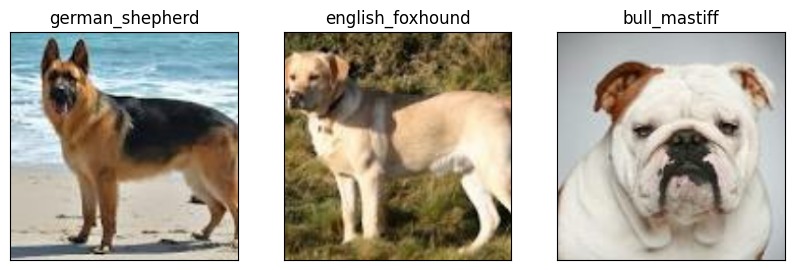

In [119]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
